# Visualize Predictions

In [5]:
import os
os.chdir('/home/rache/code/piosfinder')

## Parameters

In [6]:
import yaml
from piosfinder.train import create_dataloader, load_model 
from piosfinder.model import ResNet, ResidualBlock
import torch

from torchvision.utils import save_image, make_grid
import matplotlib.image as mpimg
from  matplotlib import pyplot as plt
import numpy as np
import torchvision
from torchvision.io import read_image
from mpl_toolkits.axes_grid1 import ImageGrid

from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns

In [7]:
# config = 'model_states/config.yaml'
config = 'configs/exp_piosfinder.yaml'
split = 'test'

## Load Data

In [8]:
# load config
print(f'Using config "{config}"')
cfg = yaml.safe_load(open(config, 'r'))

# load model
model = ResNet(ResidualBlock, [3, 4, 6, 3])
model.load_state_dict(torch.load('model_states/29.pt')['model'])

Using config "configs/exp_piosfinder.yaml"


<All keys matched successfully>

## Visualize

Visualize augmentations

In [9]:
# Create training dataloader with transformations implemented
dl_train = create_dataloader(cfg, split='train', transform = True)

Total images in trainsplit: 1246


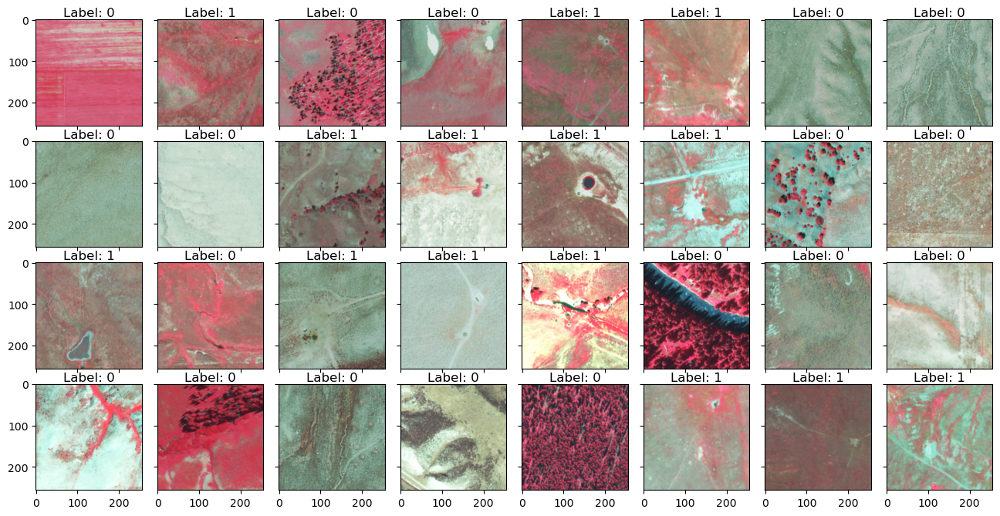

In [10]:
# Load data
data, labels = next(iter(dl_train))

fig = plt.figure(figsize=(16., 32.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(4, 8),  # creates 2x2 grid of axes
                 axes_pad=0.2,  # pad between axes in inch.
                 )

for ax, im, lb in zip(grid, data, labels):
    im = torchvision.transforms.ToPILImage()(im)
    # pred = pred.detach().numpy()
    # Iterating over the grid returns the Axes.
    ax.set_title("Label: "+ str(np.array(lb)), pad = 3)
    ax.imshow(im)

plt.show()

Now predict on the validation dataset.

In [11]:
# Create validatoin dataloader
dl_val = create_dataloader(cfg, split='val', transform = False)

Total images in valsplit: 271


In [12]:
# Load some data
data, labels = next(iter(dl_val))

# Put model on device (?)
device = cfg['device']
model.to(device)

# Evaluate model (?)
model.eval()

# Predict
prediction = model(data)

# Convert to predictions:
preds = prediction.argmax(dim=1)

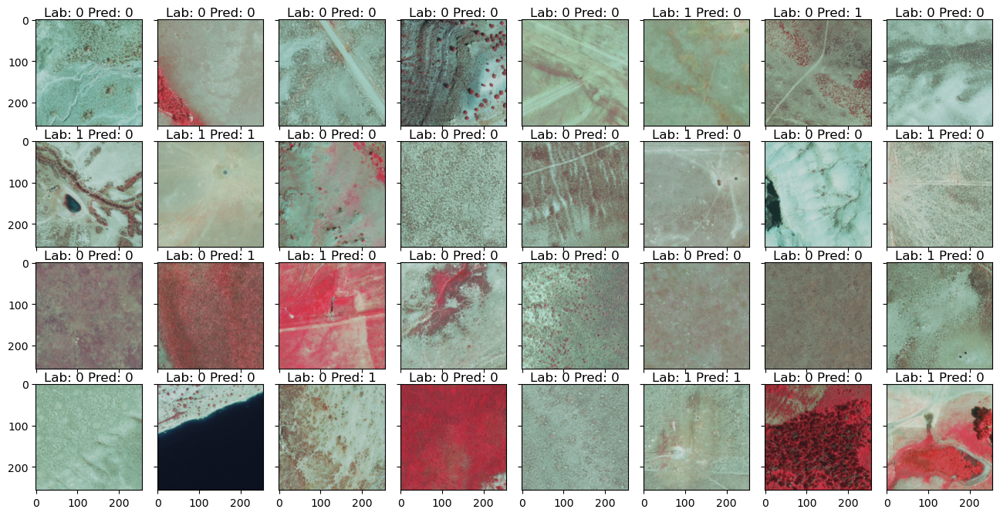

In [13]:
# Make nice figures:
fig = plt.figure(figsize=(16., 32.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(4, 8),  # creates 2x2 grid of axes
                 axes_pad=0.2,  # pad between axes in inch.
                 )

for ax, im, lb, pred in zip(grid, data, labels, preds):
    im = torchvision.transforms.ToPILImage()(im)
    # pred = pred.detach().numpy()
    # Iterating over the grid returns the Axes.
    ax.set_title("Lab: "+ str(np.array(lb)) + " Pred: " + str(pred.item()), pad = 3)
    ax.imshow(im)

plt.show()

## Visualize errors

In [14]:
# Collect false positives, false negatives, true positives for visualization
false_positives = []
false_negatives = []
true_positives = []
for idx, (data, labels) in enumerate(dl_val):  
    # truelabs.append(labels)

    # Evaluate model (?)
    model.eval()

    # Predict
    prediction = model(data)

    # Convert to predictions:
    preds = prediction.argmax(dim=1)

    # Pull out false negs and positives
    for lb, pred, img in zip(labels, preds, data):
        if lb == 1 and pred == 1:
            true_positives.append(img)
        elif lb == 0 and pred == 1:
            false_positives.append(img)
        elif lb == 1 and pred == 0:
            false_negatives.append(img)
        else:
            continue

In [21]:
# Little function to display grids of images
def show(img, title, figsize=(16,10)):
    npimg = img.numpy()
    
    plt.figure(figsize = figsize)
    plt.title(title)
    plt.imshow(np.transpose(npimg, (1,2,0)), interpolation='nearest', aspect = 'auto')

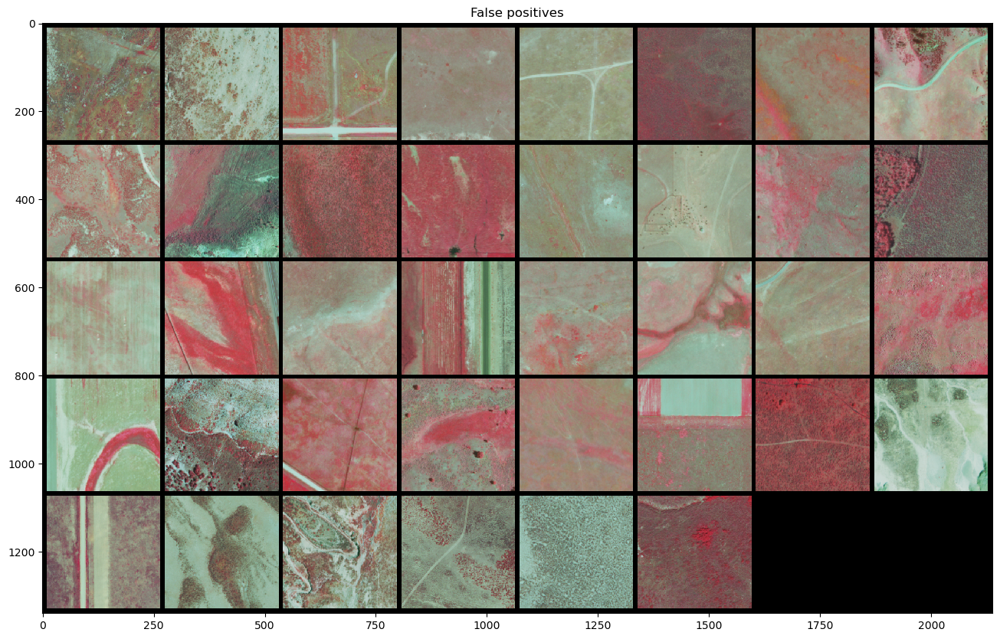

In [22]:
# Look at false positives
grid = torchvision.utils.make_grid(false_positives, nrow=8, padding=10)
show(grid, "False positives")

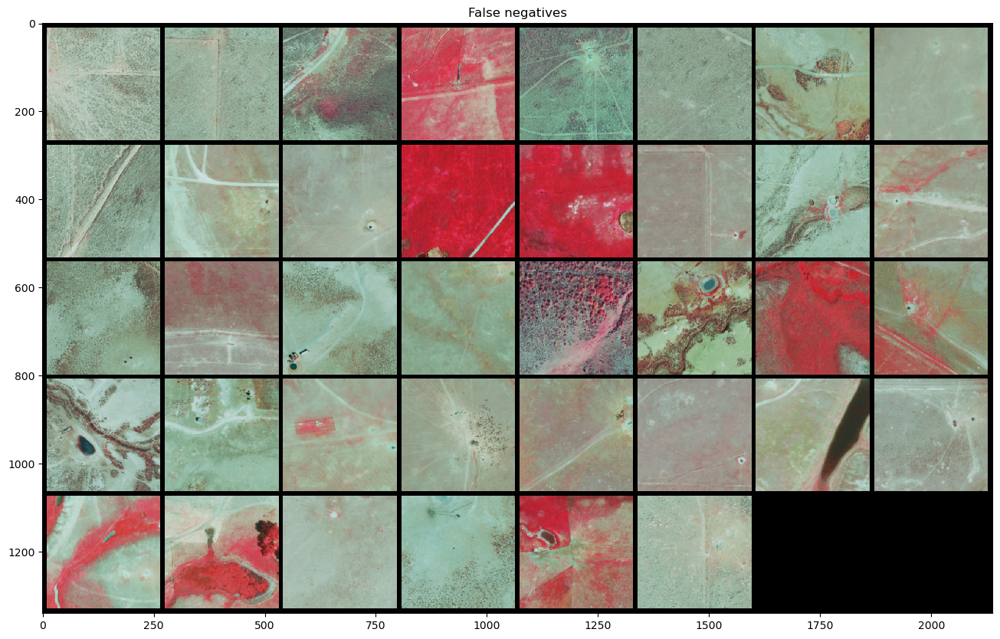

In [23]:
# Look at false negatives
grid = torchvision.utils.make_grid(false_negatives, nrow=8, padding=10)
show(grid, "False negatives")

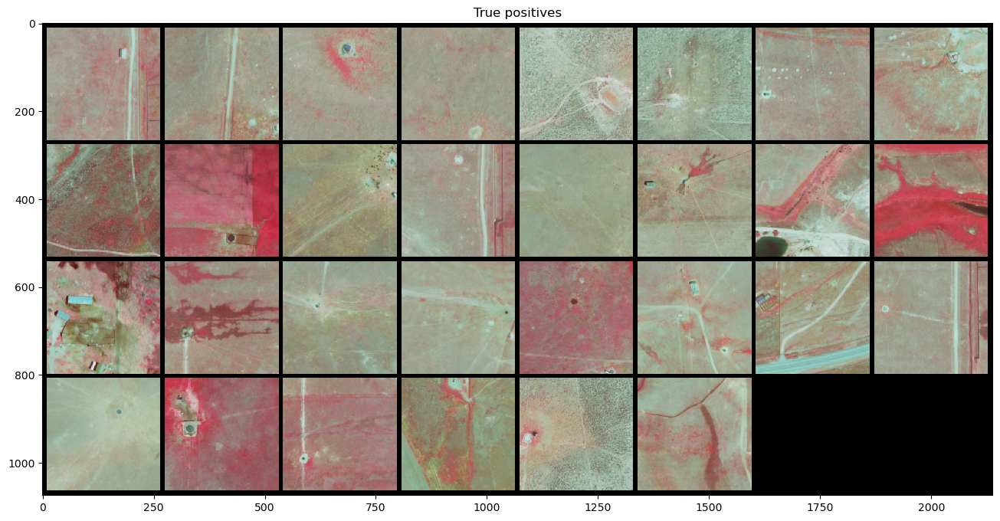

In [24]:
# Look at true positives
grid = torchvision.utils.make_grid(true_positives, nrow=8, padding=10)
show(grid,"True positives", figsize=(16,8))

## Make confusion matrix for Validation Dataset

In [28]:
nb_classes = 2

# Initialize the prediction and label lists(tensors)
predlist=torch.zeros(0,dtype=torch.long, device='cpu')
lbllist=torch.zeros(0,dtype=torch.long, device='cpu')

with torch.no_grad():
    for i, (inputs, classes) in enumerate(dl_val):
        inputs = inputs.to(device)
        classes = classes.to(device)
        outputs = model(inputs)
        preds = torch.argmax(outputs, 1)

        # Append batch prediction results
        predlist=torch.cat([predlist,preds.view(-1).cpu()])
        lbllist=torch.cat([lbllist,classes.view(-1).cpu()])

# Confusion matrix
conf_mat=confusion_matrix(lbllist.numpy(), predlist.numpy())
print(conf_mat)

# Per-class accuracy
class_accuracy=100*conf_mat.diagonal()/conf_mat.sum(1)
print(class_accuracy)

[[165  38]
 [ 38  30]]
[81.28078818 44.11764706]


Text(0.5, 23.52222222222222, 'Predicted label')

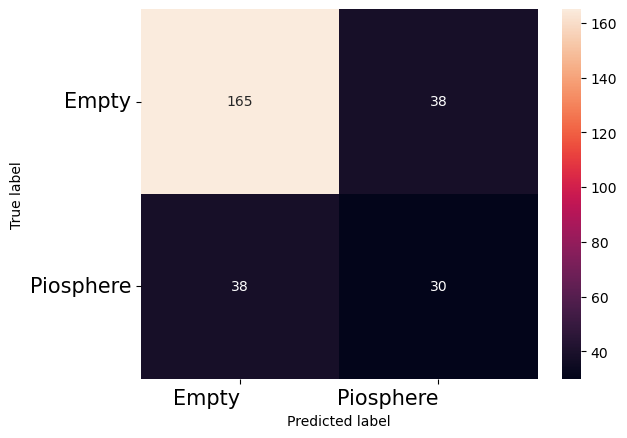

In [29]:
class_names = ['Empty','Piosphere']
df_cm = pd.DataFrame(conf_mat, index=class_names, columns=class_names).astype(int)
heatmap = sns.heatmap(df_cm, annot=True, fmt="d")

heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right',fontsize=15)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right',fontsize=15)
plt.ylabel('True label')
plt.xlabel('Predicted label')